## Setup


In [21]:
!sudo apt-get install poppler-utils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package groq


In [22]:
!pip install -q byaldi groq
!pip install flash-attn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.9/134.9 kB 5.8 MB/s eta 0:00:00


### Imports

In [4]:
import base64
import os
from getpass import getpass

os.environ['GROQ_API_KEY'] = getpass('GROQ_API_KEY')

GROQ_API_KEY··········


In [5]:
from byaldi import RAGMultiModalModel

In [11]:
RAG = RAGMultiModalModel.from_pretrained("vidore/colqwen2-v1.0", verbose=1)

Verbosity is set to 1 (active). Pass verbose=0 to make quieter.


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

### Indexing

In [12]:
RAG.index(
    input_path="annual-report-2024-small.pdf",
    index_name="infyreportsv1",
    store_collection_with_index=True,
    overwrite=True
)

Added page 1 of document 0 to index.
Added page 2 of document 0 to index.
Added page 3 of document 0 to index.
Added page 4 of document 0 to index.
Added page 5 of document 0 to index.
Added page 6 of document 0 to index.
Added page 7 of document 0 to index.
Index exported to .byaldi/infyreportsv1
Index exported to .byaldi/infyreportsv1


{0: 'annual-report-2024-small.pdf'}

## Retrieve Page

In [13]:
import random
import string

In [14]:
def generate_image_filename(extension='png'):
    # Generate a random string of 10 characters
    random_string = ''.join(random.choices(string.ascii_letters + string.digits, k=10))
    # Combine the string with the extension
    filename = f"{random_string}.{extension}"
    return filename

In [15]:
from openai import OpenAI
import uuid
import base64

In [16]:
def get_page(query):
  results = RAG.search(query, k=1)
  return results

In [17]:
from PIL import Image
from io import BytesIO
from IPython.display import display

def display_image(results):

  image_bytes = base64.b64decode(results[0].base64)


  # Create a BytesIO object from the decoded bytes
  image_stream = BytesIO(image_bytes)

  # Open the image using Pillow
  image = Image.open(image_stream)
  display(image)

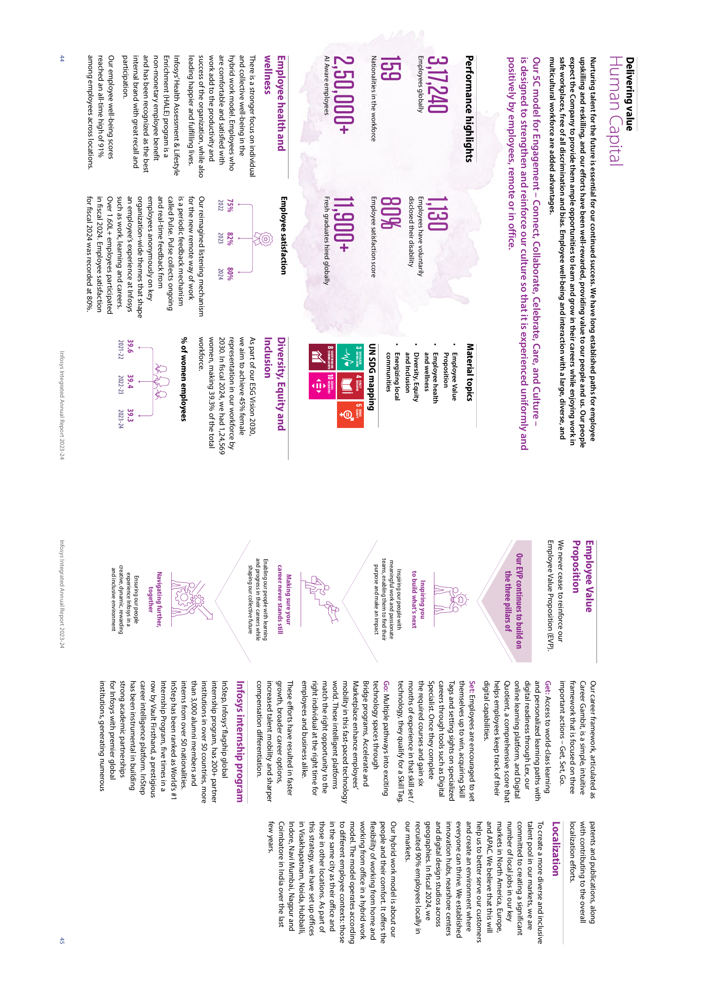

In [18]:
results = get_page("How many employees are there globally?")
display_image(results)

In [23]:
from groq import Groq
import os

In [24]:
def get_answer(query):

  results = get_page (query)
  client = Groq(api_key=os.environ.get("GROQ_API_KEY"))

  completion = client.chat.completions.create(
    model="meta-llama/llama-4-scout-17b-16e-instruct",
    messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": f"""Answer the following question based on the image provided as context. Question: {query}"""
                },
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/jpeg;base64,{results[0].base64}"
                    }
                }
            ]
        }
    ],
    temperature=1,
    max_completion_tokens=1024,
    top_p=1,
    stream=False,
    stop=None,
  )

  print(completion.choices[0].message)

  print("================================================")
  print("Respose: ", completion.choices[0].message)
  print("================================================")

  print("================================================")
  print(results[0].base64)
  print("================================================")

  print("================================================")
  display_image(results)
  print("================================================")


ChatCompletionMessage(content='According to the infographic, there are 3,17,240 employees globally.', role='assistant', executed_tools=None, function_call=None, reasoning=None, tool_calls=None)
Respose:  ChatCompletionMessage(content='According to the infographic, there are 3,17,240 employees globally.', role='assistant', executed_tools=None, function_call=None, reasoning=None, tool_calls=None)
iVBORw0KGgoAAAANSUhEUgAABnUAAAkjCAIAAABYnF2RAAEAAElEQVR4nOydd2AUVdfGz72zqZBCgAAh9JKE3ps06UgRkaqC8kkRaSJIUwFFBEUBRVTAioIKojR5UZHepfdeQgskQAgJKbtz7/fHnb6bZHcTSvD83leSnXLnzuwk2X32Oc8hnHNAEARBEARBEARBEARBEMQr6MOeAIIgCIIgCIIgCIIgCILkYVBfQxAEQRAEQRAEQRAEQRDvQX0NQRAEQRAEQRAEQRAEQbwH9TUEQRAEQRAEQRAEQRAE8R7U1xAEQRAEQRAEQRAEQRDEe1BfQxAEQRAEQRAEQRAEQRDvQX0NQRAEQRAEQRAEQRAEQbwH9TUEQRAEQRAEQRAEQRAE8R7U1xAEQRAEQRAEQRAEQRDEe1BfQxAEQRAEQRAEQRAEQRDvQX0NQRAEQRAEQRAEQRAEQbwH9TUEQRAEQRAEQRAEQRAE8R7U1xAEQRAEQRAEQRAEQRDEe1BfQxAEQRAEQRAEQRAEQRDvQX0NQRAEQRAEQRAEQRAEQbwH9TUEQRAEQRAEQRAEQRAE8R7U1xAEQRAEQRAEQRAEQRDEe1BfQx

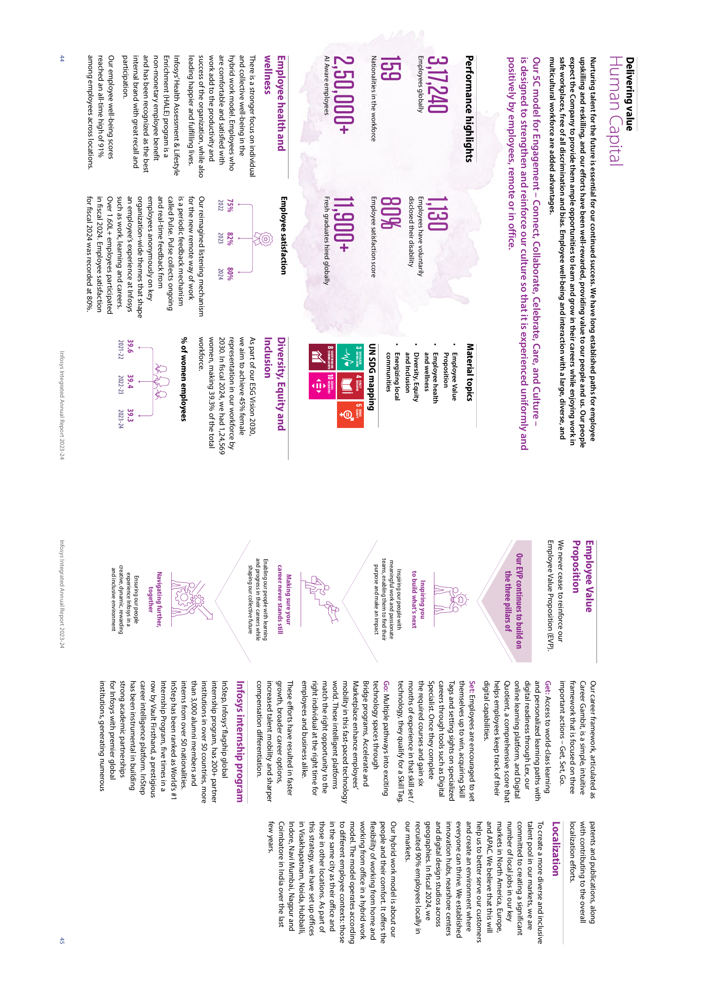

In [25]:
get_answer("How many employees are there globally?")

ChatCompletionMessage(content="The image shows that Infosys' India operations generated 67.52% of electricity from renewable sources. To find the percentage of electricity generated from non-renewable sources, we subtract this value from 100%.\n\n100% - 67.52% = 32.48%\n\nTherefore, 32.48% of electricity in Infosys' India operations comes from non-renewable sources. However, the question asks for the percentage of electricity that comes from renewable sources. \n\nThe percentage of electricity in Infosys' India operations that comes from renewable sources is 67.52%.", role='assistant', executed_tools=None, function_call=None, reasoning=None, tool_calls=None)
Respose:  ChatCompletionMessage(content="The image shows that Infosys' India operations generated 67.52% of electricity from renewable sources. To find the percentage of electricity generated from non-renewable sources, we subtract this value from 100%.\n\n100% - 67.52% = 32.48%\n\nTherefore, 32.48% of electricity in Infosys' India

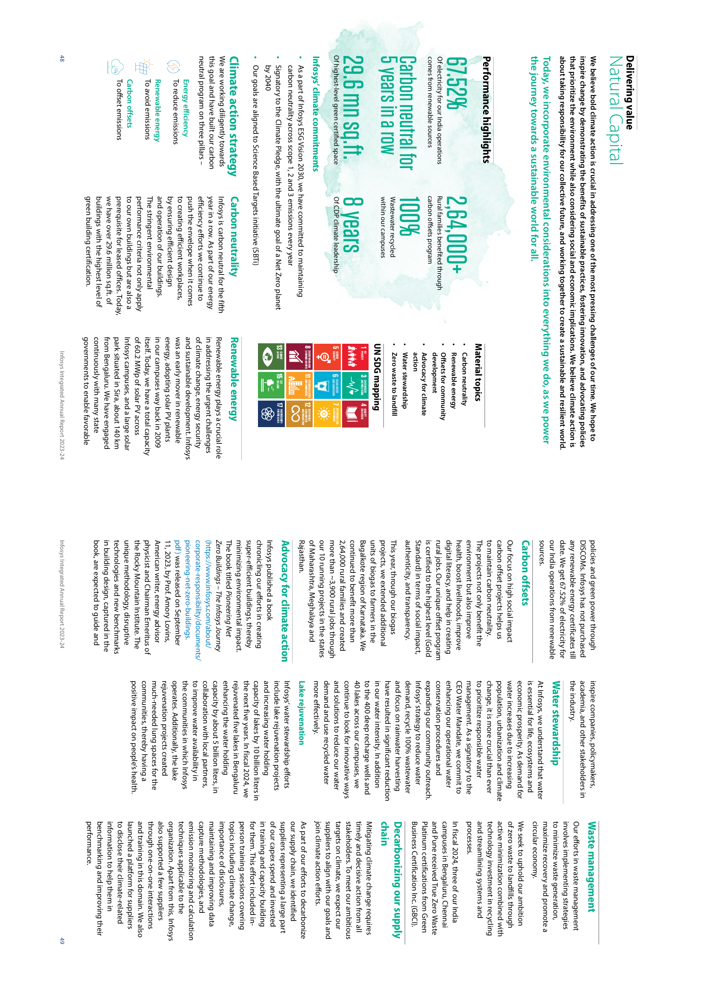

In [26]:
get_answer("What percetage of electricity in India operations comes from renewable sources?")

ChatCompletionMessage(content='The total global CSR spending was ₹577 cr.', role='assistant', executed_tools=None, function_call=None, reasoning=None, tool_calls=None)
Respose:  ChatCompletionMessage(content='The total global CSR spending was ₹577 cr.', role='assistant', executed_tools=None, function_call=None, reasoning=None, tool_calls=None)
iVBORw0KGgoAAAANSUhEUgAABnUAAAkjCAIAAABYnF2RAAEAAElEQVR4nOydeYAcVfX9z72veiZ7IOwhLIlA2GQTCPsuIIgCgooKgiirgoCACIggKqCCC8qmsvwAURYFF5A97PuOQAgRkIQlEMg+013v3t8f772q6p7JZGYSIPi9H0LSXV316tWrTmbm9Dn3kqrCMAzDMAzDMAzDMAzDMIx+wR/2BAzDMAzDMAzDMAzDMAzjI4zpa4ZhGIZhGIZhGIZhGIbRf0xfMwzDMAzDMAzDMAzDMIz+Y/qaYRiGYRiGYRiGYRiGYfQf09cMwzAMwzAMwzAMwzAMo/+YvmYYhmEYhmEYhmEYhmEY/cf0NcMwDMMwDMMwDMMwDMPoP6avGYZhGIZhGIZhGIZhGEb/MX3NMAzDMAzDMAzDMAzDMPqP6WuGYRiGYRiGYRiGYRiG0X9MXzMMwzAMwzAMwzAMwzCM/mP6mmEYhmEYhmEYhmEYhmH0H9PXDMMwDMMwDMMwDMMwDKP/mL5mGIZhGIZhGIZhGIZhGP3H9DXDMAzDMAzDMAzDMAzD6D+mrxmGYRiGYRiGYRiGYRhG/zF9zTAMwzAMwzAMwzAMwzD6j+lrhmEYhmEYhmEYhmEYhtF/TF8zDMMwDMMwDMMwDM

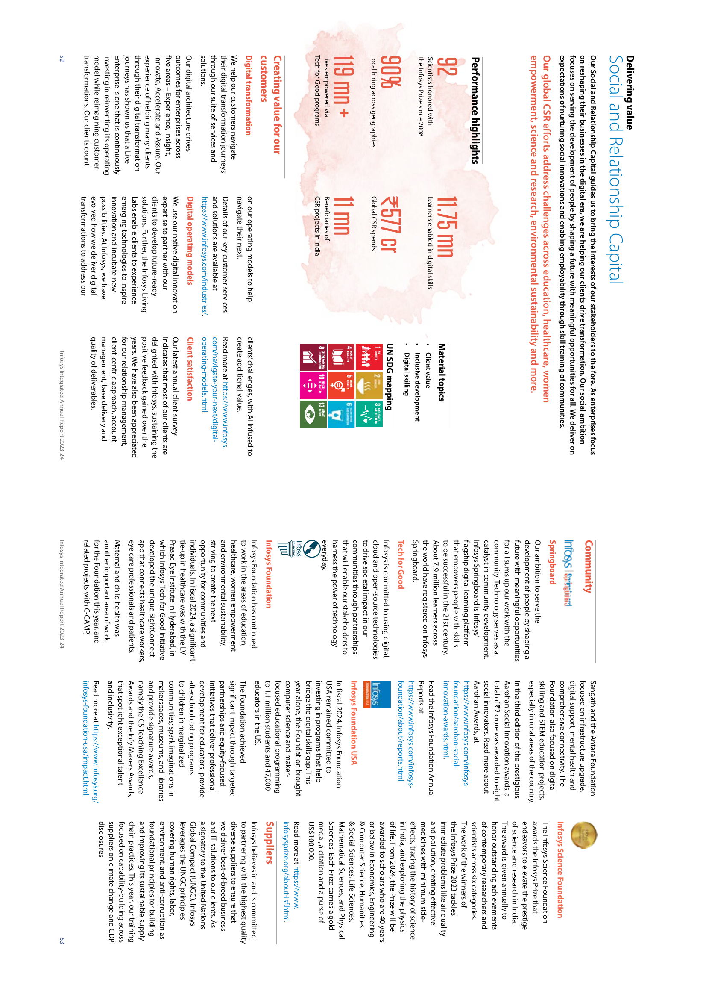

In [27]:
get_answer("How much was global CSR spends?")